## Problem Statement:
PredCatch Analytics' Australian banking client's profitability and reputation are being hit by fraudulent ATM transactions. They want PredCatch to help them in reducing and if possible completely eliminating such fraudulent transactions. PredCatch believes it can do the same by building a predictive model to catch such fraudulent transactions in real time and decline them. Your job as PredCatch's Data Scientist is to build this fraud detection & prevention predictive model in the first step. If successful, in the 2nd step you will have to present your solutions and explain how it works to the client. The data has been made available to you.

The challenging part of the problem is that the data contains very few fraud instances in comparison to the overall population. To give more edge to the solution they have also collected data regarding location [geo_scores] of the transactions, their own proprietary index [Lambda_wts], on network turn around times [Qset_tats] and vulnerability qualification score [instance_scores]. As of now you don't need to understand what they mean.
Training data contains masked variables pertaining to each transaction id . Your prediction target here is 'Target' .

1: Fraudulent transactions


0: Clean transactions


In [6]:
# !pip install pandas_profiling
# !pip install pycaret

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import seaborn as sns
import statsmodels.api as sm

from imblearn.over_sampling import RandomOverSampler
from numba import jit, cuda
from pandas_profiling import ProfileReport
from pycaret.classification import *
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from statsmodels.formula.api import ols

sns.set()
%matplotlib inline

In [7]:
#Reading all the given files as dataframes

location_df = pd.read_csv('/Geo_scores.csv')
location_df.head()

,id,geo_score
0,26674,4.48
1,204314,4.48
2,176521,5.17
3,48812,-2.41
4,126870,6.55


In [8]:
propindex_df = pd.read_csv('/Lambda_wts.csv')
propindex_df.head()

,Group,lambda_wt
0,Grp936,3.41
1,Grp347,-2.88
2,Grp188,0.39
3,Grp1053,-2.75
4,Grp56,-0.83


In [9]:
nettat_df = pd.read_csv('/Qset_tats.csv')
nettat_df.head()

,id,qsets_normalized_tat
0,9983,2.41
1,266000,3.10
2,77525,1.03
3,160765,-11.63
4,138220,-4.48


In [10]:
vqs_df = pd.read_csv('/instance_scores.csv')
vqs_df.head()

,id,instance_scores
0,173444,-0.88
1,259378,1.50
2,161170,0.44
3,191161,0.76
4,34521,-0.84


In [11]:
# Reading the training file

dataset_df = pd.read_csv('/train.csv')
dataset_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,...,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target
0,112751,Grp169,1.070000,0.580000,0.480000,0.766667,1.233333,1.993333,0.340000,1.010000,...,0.680000,0.726667,0.606667,1.010000,0.933333,0.603333,0.686667,0.673333,-245.7500,0
1,18495,Grp161,0.473333,1.206667,0.883333,1.430000,0.726667,0.626667,0.810000,0.783333,...,0.716667,0.743333,0.680000,0.690000,0.560000,0.670000,0.553333,0.653333,-248.0000,0
2,23915,Grp261,1.130000,0.143333,0.946667,0.123333,0.080000,0.836667,0.056667,0.756667,...,0.690000,0.820000,0.600000,0.383333,0.763333,0.670000,0.686667,0.673333,-233.1250,0
3,50806,Grp198,0.636667,1.090000,0.750000,0.940000,0.743333,0.346667,0.956667,0.633333,...,0.720000,0.900000,0.680000,0.846667,0.423333,0.520000,0.846667,0.760000,-249.7775,0
4,184244,Grp228,0.560000,1.013333,0.593333,0.416667,0.773333,0.460000,0.853333,0.796667,...,0.603333,0.486667,0.693333,0.526667,0.520000,0.716667,0.706667,0.673333,-247.5775,0


In [12]:
# Reading the testing file

test_df = pd.read_csv('/test_share.csv')
test_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
0,146574,Grp229,-0.300000,1.540000,0.220000,-0.280000,0.570000,0.260000,0.700000,1.076667,...,0.786667,0.546667,0.313333,0.703333,0.813333,0.776667,0.796667,0.823333,0.783333,-249.7500
1,268759,Grp141,0.633333,0.953333,0.810000,0.466667,0.910000,0.253333,1.040000,0.550000,...,0.636667,0.770000,0.993333,0.536667,0.703333,0.806667,0.630000,0.673333,0.673333,-249.8125
2,59727,Grp188,1.043333,0.740000,0.860000,1.006667,0.583333,0.616667,0.630000,0.686667,...,0.626667,0.756667,0.953333,0.623333,0.753333,0.870000,0.596667,0.680000,0.670000,-248.1200
3,151544,Grp426,1.283333,0.300000,0.576667,0.636667,0.256667,0.543333,0.356667,0.663333,...,0.480000,0.460000,0.260000,0.800000,0.606667,0.456667,0.320000,0.676667,0.660000,-222.9875
4,155008,Grp443,1.186667,0.326667,0.476667,0.866667,0.436667,0.680000,0.476667,0.686667,...,0.706667,0.740000,0.823333,0.670000,0.896667,0.566667,0.546667,0.650000,0.663333,-196.2200


### Observing that the data in additional csv files are not present in test dataset. Not combining them with the train dataset.

In [13]:
# Checking for missing values in the traning dataset

dataset_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 227845 entries, 0 to 227844
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              227845 non-null  int64  
 1   Group           227845 non-null  object 
 2   Per1            227845 non-null  float64
 3   Per2            227845 non-null  float64
 4   Per3            227845 non-null  float64
 5   Per4            227845 non-null  float64
 6   Per5            227845 non-null  float64
 7   Per6            227845 non-null  float64
 8   Per7            227845 non-null  float64
 9   Per8            227845 non-null  float64
 10  Per9            227845 non-null  float64
 11  Dem1            227845 non-null  float64
 12  Dem2            227845 non-null  float64
 13  Dem3            227845 non-null  float64
 14  Dem4            227845 non-null  float64
 15  Dem5            227845 non-null  float64
 16  Dem6            227845 non-null  float64
 17  Dem7      

In [14]:
# Checking for missing values in the traning dataset

test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56962 entries, 0 to 56961
Data columns (total 27 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              56962 non-null  int64  
 1   Group           56962 non-null  object 
 2   Per1            56962 non-null  float64
 3   Per2            56962 non-null  float64
 4   Per3            56962 non-null  float64
 5   Per4            56962 non-null  float64
 6   Per5            56962 non-null  float64
 7   Per6            56962 non-null  float64
 8   Per7            56962 non-null  float64
 9   Per8            56962 non-null  float64
 10  Per9            56962 non-null  float64
 11  Dem1            56962 non-null  float64
 12  Dem2            56962 non-null  float64
 13  Dem3            56962 non-null  float64
 14  Dem4            56962 non-null  float64
 15  Dem5            56962 non-null  float64
 16  Dem6            56962 non-null  float64
 17  Dem7            56962 non-null 

#### There are no missing values in training and test datasets

In [15]:
# Checking for duplicated rows in training dataset

dataset_df.duplicated().sum()

0

In [16]:
# Checking for duplicated rows in test dataset

test_df.duplicated().sum()

0

#### There are no duplicate entries in training and test datasets

In [17]:
# Spliting data into train and test

train_df, validation_df = train_test_split(dataset_df, train_size = 0.7, random_state = 1, stratify = dataset_df['Target'])

In [18]:
train_df.head()

,id,Group,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,...,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target
47130,64508,Grp66,0.110000,-0.916667,0.726667,1.580000,-0.193333,1.030000,0.996667,0.656667,...,0.916667,0.486667,0.236667,0.890000,0.670000,0.493333,0.613333,0.760000,103.6850,0
114257,236466,Grp10,0.380000,0.870000,0.733333,0.346667,0.956667,1.120000,0.816667,0.953333,...,0.720000,0.843333,0.750000,0.606667,0.453333,0.636667,0.690000,0.700000,-235.0000,0
97487,21034,Grp46,1.016667,0.570000,0.896667,0.946667,0.370000,0.513333,0.586667,0.703333,...,0.593333,0.433333,0.686667,0.836667,0.733333,0.716667,0.653333,0.673333,-233.7525,0
37519,173406,Grp71,0.686667,0.746667,1.196667,0.750000,0.500000,0.526667,0.706667,0.593333,...,0.753333,1.036667,0.740000,0.803333,0.073333,0.490000,0.696667,0.700000,-242.4400,0
63159,281031,Grp143,0.583333,0.933333,1.160000,0.750000,0.700000,0.570000,0.810000,0.690000,...,0.773333,1.006667,0.596667,0.630000,0.516667,0.456667,0.746667,0.733333,-249.7500,0


In [19]:
train_df.shape

(159491, 28)

In [20]:
validation_df.shape

(68354, 28)

## EDA

In [21]:
# Visualising the data
# Since we plot all data takes long time to process and since there in imbalance not able to visualise clearly

jit(target_backend='gpu')
def viz1():
  numeric_cols = train_df.select_dtypes(include = np.number)
  column_names = list(numeric_cols.columns)
  columns_index = 0

  plot_rows = 9
  plot_cols = 3

  fig, ax = plt.subplots(nrows = plot_rows, ncols = plot_cols, figsize = (20,20))

  for row_count in range(plot_rows):
      for col_count in range(plot_cols):
          ax[row_count][col_count].scatter(y = train_df[column_names[columns_index]], x = train_df.index, c = np.array(['b','y'])[train_df['Target']])
          ax[row_count][col_count].set_ylabel(column_names[columns_index])
          columns_index += 1

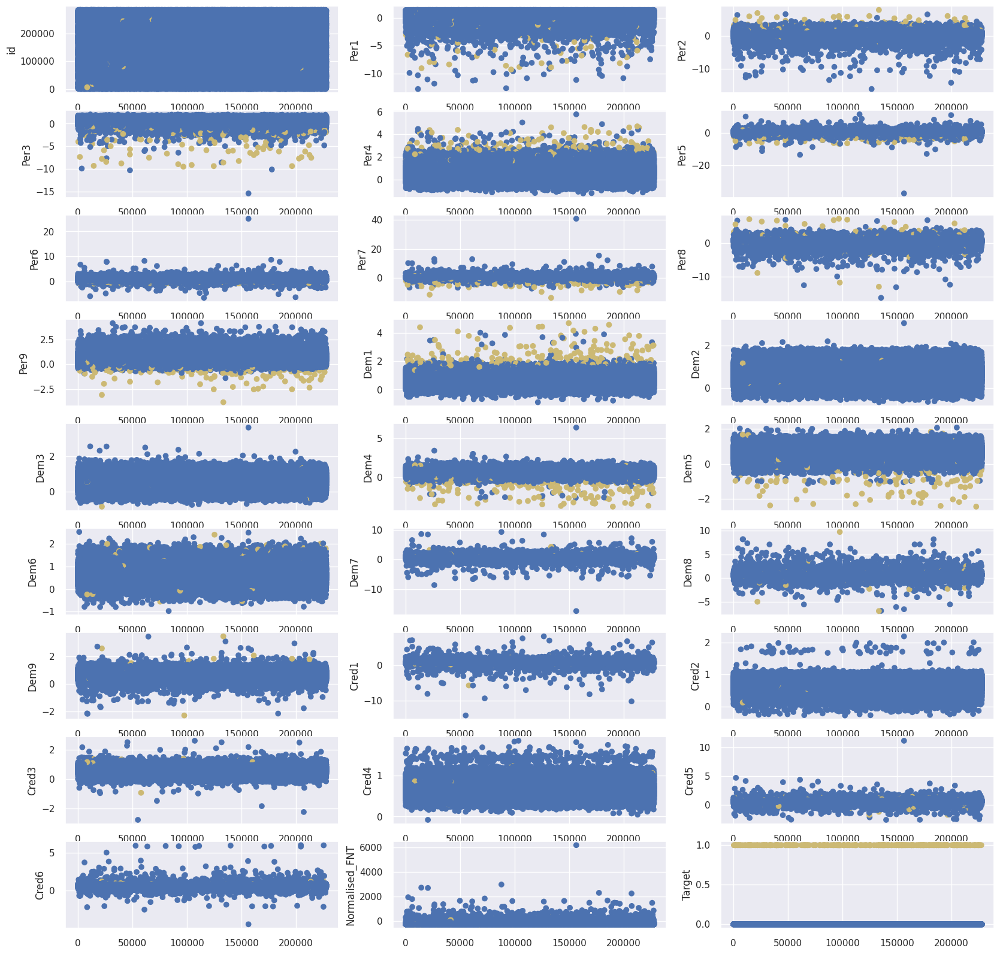

In [22]:
viz1()

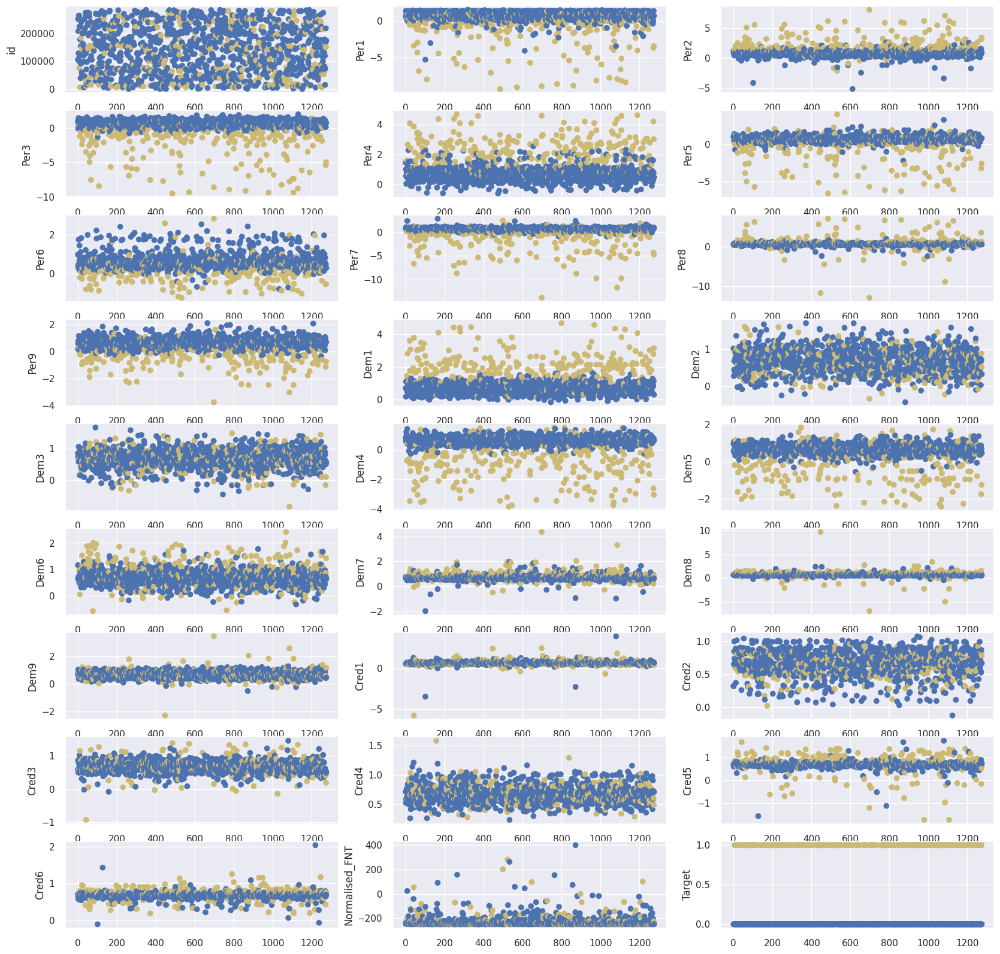

In [23]:
# Visualising the data
# Visualising a sample of data to clearly distinguish to see significant variables

numeric_cols = train_df.select_dtypes(include = np.number)

genuine_trans = numeric_cols.loc[numeric_cols['Target'] == 0, :]
fraud_trans = numeric_cols.loc[numeric_cols['Target'] == 1, :]

genuine_trans_sub = genuine_trans.sample(n=1000, replace = False)

new_df = pd.concat([fraud_trans, genuine_trans_sub], axis = 0)
new_df = new_df.sample(frac = 1)
new_df.reset_index(drop = True, inplace = True)

column_names = list(numeric_cols.columns)
columns_index = 0

plot_rows = 9
plot_cols = 3

fig, ax = plt.subplots(nrows = plot_rows, ncols = plot_cols, figsize = (20,20))

colormap = np.array(['b','y'])

for row_count in range(plot_rows):
    for col_count in range(plot_cols):
        ax[row_count][col_count].scatter(y = new_df[column_names[columns_index]], x = new_df.index, c = colormap[new_df['Target']])
        ax[row_count][col_count].set_ylabel(column_names[columns_index])
        columns_index += 1

### From the above plots we can see that
* Columns Per1, Per2, Per3, Per4, Per5, Per6, Per7, Per9, Der1, Der4, Der5 and Cred5 seem to be significant
* We also see a few outliers throughout the dataset
* There seems to be skewness throughout


### Advanced EDA - Using Pandas Profiling

In [24]:
prof = ProfileReport(train_df)
prof.to_file(output_file = "/EDA - Fraudulant ATM Transactions.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

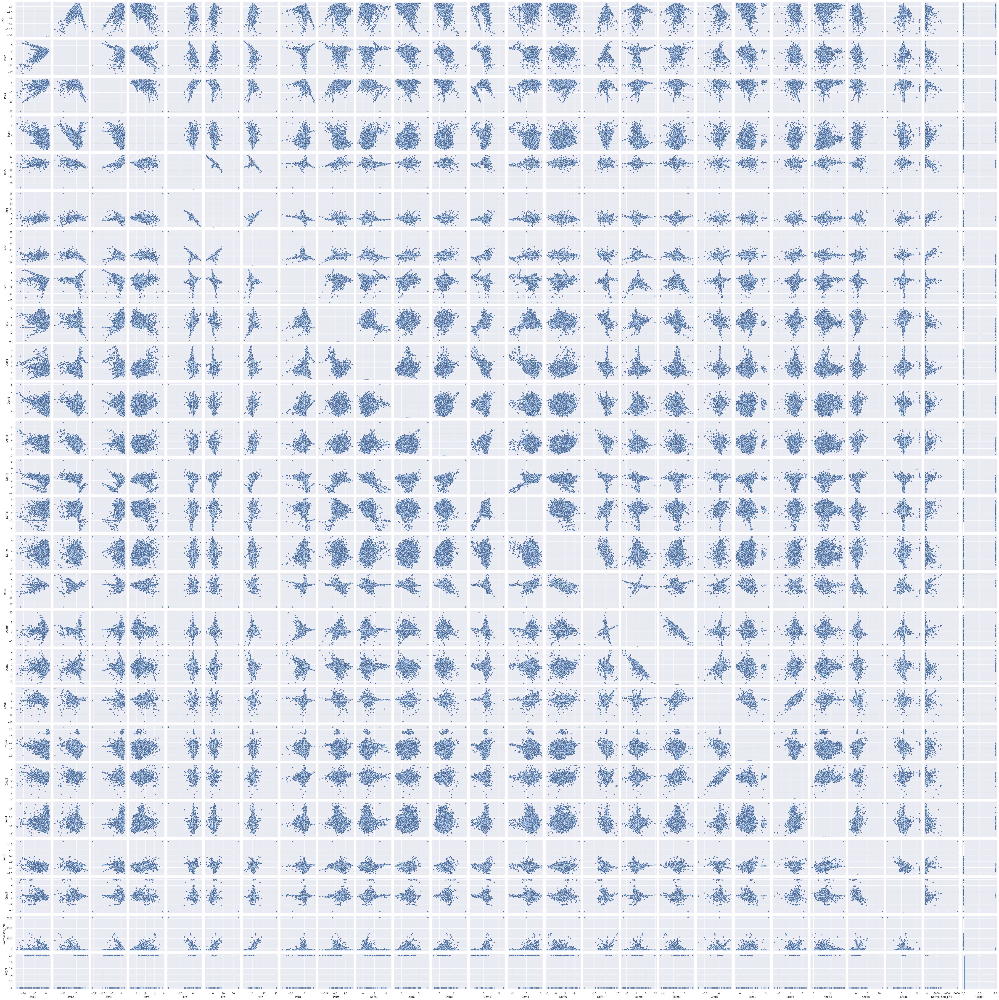

In [70]:
@jit(target_backend='cuda')
def pp():
  sns.pairplot(train_df)

pp()

#### Pandas Profiling and pairplot confirms the above observations
#### Additionally we can observe the below
* There is no corellation greater that 75% in the dataset
* There is no high auto corellation

In [26]:
# Encoding
# Only one column is of type object, encoding needed for 'Group' column only

# Converting object type to integer

train_df['Group'] = train_df['Group'].astype('category')
train_df['Group'] = train_df['Group'].cat.codes

In [27]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 159491 entries, 47130 to 199795
Data columns (total 28 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              159491 non-null  int64  
 1   Group           159491 non-null  int16  
 2   Per1            159491 non-null  float64
 3   Per2            159491 non-null  float64
 4   Per3            159491 non-null  float64
 5   Per4            159491 non-null  float64
 6   Per5            159491 non-null  float64
 7   Per6            159491 non-null  float64
 8   Per7            159491 non-null  float64
 9   Per8            159491 non-null  float64
 10  Per9            159491 non-null  float64
 11  Dem1            159491 non-null  float64
 12  Dem2            159491 non-null  float64
 13  Dem3            159491 non-null  float64
 14  Dem4            159491 non-null  float64
 15  Dem5            159491 non-null  float64
 16  Dem6            159491 non-null  float64
 17  Dem7  

In [28]:
# Checking for unique values

train_df['Group'].nunique()


1197

In [29]:
train_df['Group'].iloc[0]

889

In [30]:
train_df['Group'].iloc[1]

2

In [31]:
# Checking whether Group is a significant variable or not
# check p-value

model = ols('Target ~ Group', data = train_df).fit()
anova_result = sm.stats.anova_lm(model, typ=2)
print(anova_result)

              sum_sq        df         F    PR(>F)
Group       0.000816       1.0  0.472489  0.491846
Residual  275.521564  159489.0       NaN       NaN


#### Since p-value is greater that 0.05 the Group feature is not significant

#### We can also see that column 'id' is insignificat

In [32]:
# Droping the insignificant features

insignificant_train_df = train_df.iloc[:,0:2]
insignificant_train_df.head()

,id,Group
47130,64508,889
114257,236466,2
97487,21034,683
37519,173406,929
63159,281031,334


In [33]:
train_df.drop(columns = ['id','Group'], inplace = True)
train_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target
47130,0.110000,-0.916667,0.726667,1.580000,-0.193333,1.030000,0.996667,0.656667,1.010000,0.890000,...,0.916667,0.486667,0.236667,0.890000,0.670000,0.493333,0.613333,0.760000,103.6850,0
114257,0.380000,0.870000,0.733333,0.346667,0.956667,1.120000,0.816667,0.953333,0.630000,0.673333,...,0.720000,0.843333,0.750000,0.606667,0.453333,0.636667,0.690000,0.700000,-235.0000,0
97487,1.016667,0.570000,0.896667,0.946667,0.370000,0.513333,0.586667,0.703333,0.830000,0.986667,...,0.593333,0.433333,0.686667,0.836667,0.733333,0.716667,0.653333,0.673333,-233.7525,0
37519,0.686667,0.746667,1.196667,0.750000,0.500000,0.526667,0.706667,0.593333,0.976667,0.500000,...,0.753333,1.036667,0.740000,0.803333,0.073333,0.490000,0.696667,0.700000,-242.4400,0
63159,0.583333,0.933333,1.160000,0.750000,0.700000,0.570000,0.810000,0.690000,0.703333,0.250000,...,0.773333,1.006667,0.596667,0.630000,0.516667,0.456667,0.746667,0.733333,-249.7500,0


In [34]:
insignificant_val_df = validation_df.iloc[:,0:2]
insignificant_val_df.head()

,id,Group
128229,262275,Grp380
12233,187928,Grp143
168508,199976,Grp259
183452,154598,Grp17
69908,176776,Grp41


In [35]:
validation_df.drop(columns = ['id','Group'], inplace = True)
validation_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target
128229,1.290000,0.646667,0.200000,1.110000,0.686667,0.243333,0.846667,0.546667,0.743333,0.373333,...,0.640000,0.523333,0.720000,0.656667,0.660000,0.393333,0.656667,0.653333,-227.5000,0
12233,1.343333,0.406667,0.153333,0.476667,0.596667,0.496667,0.600000,0.620000,1.260000,0.110000,...,0.740000,0.976667,0.623333,0.866667,0.783333,1.016667,0.636667,0.643333,-238.7500,0
168508,0.713333,0.983333,0.460000,0.406667,1.070000,0.600000,0.953333,0.693333,0.583333,0.833333,...,0.556667,0.390000,0.673333,0.660000,0.540000,0.710000,0.740000,0.690000,-248.5025,0
183452,1.290000,0.663333,0.133333,0.830000,0.806667,0.526667,0.660000,0.613333,1.310000,1.443333,...,0.566667,0.493333,0.723333,0.850000,0.630000,0.603333,0.653333,0.660000,-233.6850,0
69908,0.376667,0.370000,1.123333,-0.360000,0.333333,0.820000,0.186667,0.953333,0.066667,0.573333,...,0.686667,0.730000,0.656667,0.720000,0.546667,0.553333,0.676667,0.673333,-243.0650,0


In [36]:
insignificant_test_df = test_df.iloc[:,0:2]
insignificant_test_df.head()

,id,Group
0,146574,Grp229
1,268759,Grp141
2,59727,Grp188
3,151544,Grp426
4,155008,Grp443


In [37]:
test_df.drop(columns = ['id','Group'], inplace = True)
test_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
0,-0.300000,1.540000,0.220000,-0.280000,0.570000,0.260000,0.700000,1.076667,0.930000,0.156667,...,0.786667,0.546667,0.313333,0.703333,0.813333,0.776667,0.796667,0.823333,0.783333,-249.7500
1,0.633333,0.953333,0.810000,0.466667,0.910000,0.253333,1.040000,0.550000,0.543333,0.433333,...,0.636667,0.770000,0.993333,0.536667,0.703333,0.806667,0.630000,0.673333,0.673333,-249.8125
2,1.043333,0.740000,0.860000,1.006667,0.583333,0.616667,0.630000,0.686667,0.593333,1.250000,...,0.626667,0.756667,0.953333,0.623333,0.753333,0.870000,0.596667,0.680000,0.670000,-248.1200
3,1.283333,0.300000,0.576667,0.636667,0.256667,0.543333,0.356667,0.663333,1.156667,1.186667,...,0.480000,0.460000,0.260000,0.800000,0.606667,0.456667,0.320000,0.676667,0.660000,-222.9875
4,1.186667,0.326667,0.476667,0.866667,0.436667,0.680000,0.476667,0.686667,1.476667,1.213333,...,0.706667,0.740000,0.823333,0.670000,0.896667,0.566667,0.546667,0.650000,0.663333,-196.2200


In [38]:
# Checking for data imbalance in training dataset

train_df['Target'].value_counts()

0    159215
1       276
Name: Target, dtype: int64

In [39]:
# Checking percentage of minority class

print(276/(276+159215)*100,"%")

0.17305051695706966 %


In [40]:
# Checking for data imbalance in validation dataset

validation_df['Target'].value_counts()

0    68236
1      118
Name: Target, dtype: int64

In [41]:
# Checking percentage of minority class

print(118/(118+68236)*100,"%")

0.17263071656377096 %


#### We can see a clear data imbalance
* Minority class is only 0.17% in train and validation datasets (stratified)

In [42]:
# Balancing the dataset by oversampling (Random Oversampler technique)
# Spliting x and y (DV and IDV) first

train_features_df = train_df.iloc[:,:-1]
train_target_df = train_df.iloc[:,-1]

validation_features_df = validation_df.iloc[:,:-1]
validation_target_df = validation_df.iloc[:,-1]

In [43]:
train_features_df.columns

Index(['Per1', 'Per2', 'Per3', 'Per4', 'Per5', 'Per6', 'Per7', 'Per8', 'Per9',
       'Dem1', 'Dem2', 'Dem3', 'Dem4', 'Dem5', 'Dem6', 'Dem7', 'Dem8', 'Dem9',
       'Cred1', 'Cred2', 'Cred3', 'Cred4', 'Cred5', 'Cred6', 'Normalised_FNT'],
      dtype='object')

In [44]:
train_target_df.head()

47130     0
114257    0
97487     0
37519     0
63159     0
Name: Target, dtype: int64

In [45]:
validation_features_df.columns

Index(['Per1', 'Per2', 'Per3', 'Per4', 'Per5', 'Per6', 'Per7', 'Per8', 'Per9',
       'Dem1', 'Dem2', 'Dem3', 'Dem4', 'Dem5', 'Dem6', 'Dem7', 'Dem8', 'Dem9',
       'Cred1', 'Cred2', 'Cred3', 'Cred4', 'Cred5', 'Cred6', 'Normalised_FNT'],
      dtype='object')

In [46]:
validation_target_df.head()

128229    0
12233     0
168508    0
183452    0
69908     0
Name: Target, dtype: int64

In [47]:
print(train_features_df.shape, validation_features_df.shape, train_target_df.shape, validation_target_df.shape)

(159491, 25) (68354, 25) (159491,) (68354,)


#### Minority class before and after train test spllt is 0.17%

In [48]:
# Oversampling of train data using Random Over Sampling Technique

over = RandomOverSampler()
ovrsam_train_features, ovrsam_train_target = over.fit_resample(train_features_df, train_target_df)
ovrsam_val_features, ovrsam_val_target = over.fit_resample(validation_features_df, validation_target_df)

In [49]:
# After oversampling

print("Shape : ", ovrsam_train_features.shape, ovrsam_train_target.shape, ovrsam_val_features.shape, ovrsam_val_target.shape)
print("Value counts : ", ovrsam_train_target.value_counts(), ovrsam_val_target.value_counts())

Shape :  (318430, 25) (318430,) (136472, 25) (136472,)
Value counts :  0    159215
1    159215
Name: Target, dtype: int64 0    68236
1    68236
Name: Target, dtype: int64


#### Data imbalance is cleared

### Using pycaret to find the best model (without any data preprocessing)

In [50]:
raw_clf = setup(data = ovrsam_train_features, target = ovrsam_train_target, use_gpu = True, pca = True, pca_components = 0.95, session_id = 111)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Description,Value
0,Session id,111
1,Target,Target
2,Target type,Binary
3,Original data shape,"(318430, 26)"
4,Transformed data shape,"(318430, 2)"
5,Transformed train set shape,"(222901, 2)"
6,Transformed test set shape,"(95529, 2)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

In [51]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9948,0.9982,0.9957,0.9938,0.9948,0.9895,0.9895,1.8600
et,Extra Trees Classifier,0.9901,0.9927,0.9825,0.9976,0.9900,0.9802,0.9803,1.6840
rf,Random Forest Classifier,0.9890,0.9977,0.9803,0.9976,0.9888,0.9779,0.9781,4.2830
dt,Decision Tree Classifier,0.9888,0.9890,0.9799,0.9976,0.9886,0.9775,0.9777,0.7120
gbc,Gradient Boosting Classifier,0.8126,0.9041,0.7439,0.8625,0.7988,0.6253,0.6313,12.2530
xgboost,Extreme Gradient Boosting,0.7952,0.8947,0.7863,0.8006,0.7933,0.5903,0.5905,0.7880
lightgbm,Light Gradient Boosting Machine,0.7860,0.8960,0.7653,0.7985,0.7814,0.5720,0.5726,1.0330
ada,Ada Boost Classifier,0.7441,0.8184,0.6583,0.7948,0.7201,0.4882,0.4956,3.7150
nb,Naive Bayes,0.5324,0.4258,0.1511,0.6367,0.2442,0.0649,0.1003,0.3480
qda,Quadratic Discriminant Analysis,0.5324,0.4258,0.1511,0.6367,0.2442,0.0649,0.1003,0.3620


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

### Without any of the data preprocessing Decission Tree and Random Forest Models seem to have the highest train accuracy afetr cross validation.

### Iterating after outlier treatment to see if we get a better result

In [52]:
# Checking for outliers in train data
# Creating a new dataframe to hold the outlier treated dataset

outltrtd_train_features = ovrsam_train_features
outltrtd_train_target = ovrsam_train_target

In [53]:
outltrtd_train_features.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
0,0.110000,-0.916667,0.726667,1.580000,-0.193333,1.030000,0.996667,0.656667,1.010000,0.890000,...,1.586667,0.916667,0.486667,0.236667,0.890000,0.670000,0.493333,0.613333,0.760000,103.6850
1,0.380000,0.870000,0.733333,0.346667,0.956667,1.120000,0.816667,0.953333,0.630000,0.673333,...,0.590000,0.720000,0.843333,0.750000,0.606667,0.453333,0.636667,0.690000,0.700000,-235.0000
2,1.016667,0.570000,0.896667,0.946667,0.370000,0.513333,0.586667,0.703333,0.830000,0.986667,...,0.633333,0.593333,0.433333,0.686667,0.836667,0.733333,0.716667,0.653333,0.673333,-233.7525
3,0.686667,0.746667,1.196667,0.750000,0.500000,0.526667,0.706667,0.593333,0.976667,0.500000,...,0.666667,0.753333,1.036667,0.740000,0.803333,0.073333,0.490000,0.696667,0.700000,-242.4400
4,0.583333,0.933333,1.160000,0.750000,0.700000,0.570000,0.810000,0.690000,0.703333,0.250000,...,0.593333,0.773333,1.006667,0.596667,0.630000,0.516667,0.456667,0.746667,0.733333,-249.7500


In [54]:
outltrtd_train_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318430 entries, 0 to 318429
Data columns (total 25 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Per1            318430 non-null  float64
 1   Per2            318430 non-null  float64
 2   Per3            318430 non-null  float64
 3   Per4            318430 non-null  float64
 4   Per5            318430 non-null  float64
 5   Per6            318430 non-null  float64
 6   Per7            318430 non-null  float64
 7   Per8            318430 non-null  float64
 8   Per9            318430 non-null  float64
 9   Dem1            318430 non-null  float64
 10  Dem2            318430 non-null  float64
 11  Dem3            318430 non-null  float64
 12  Dem4            318430 non-null  float64
 13  Dem5            318430 non-null  float64
 14  Dem6            318430 non-null  float64
 15  Dem7            318430 non-null  float64
 16  Dem8            318430 non-null  float64
 17  Dem9      

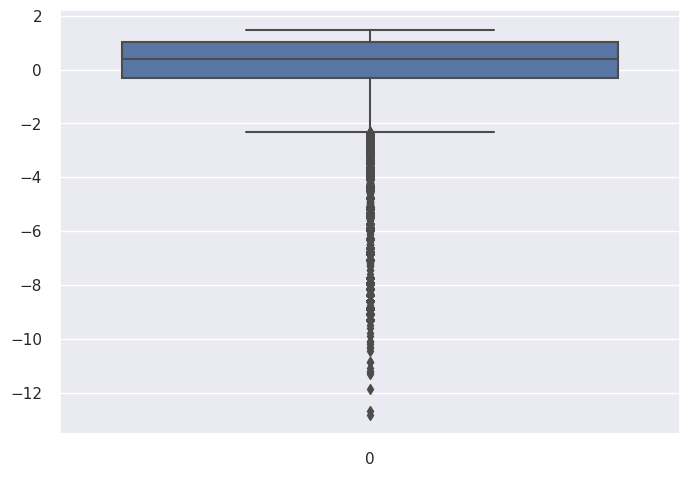

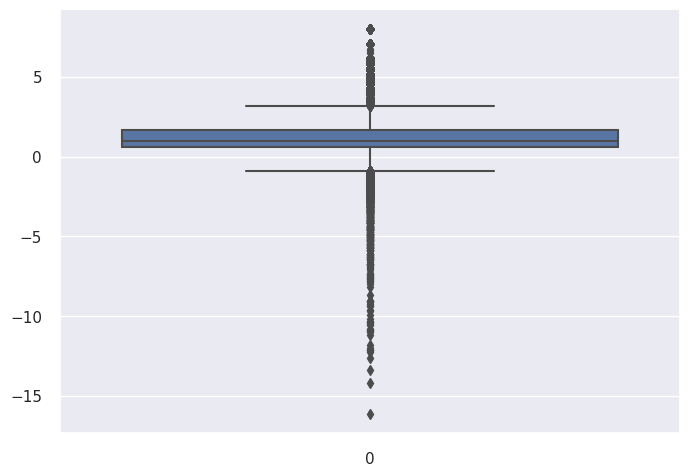

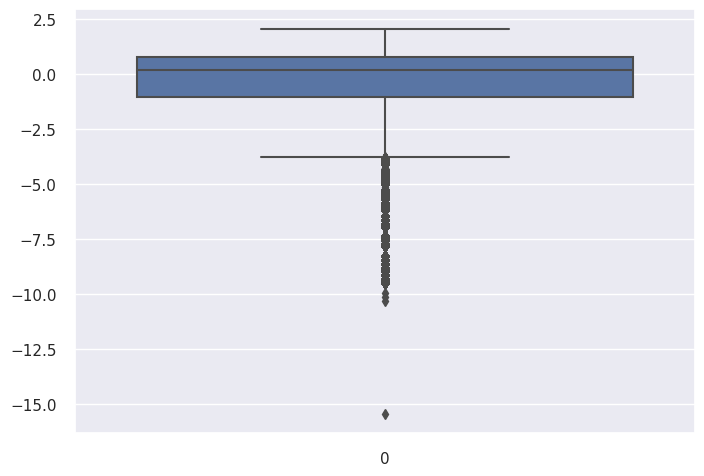

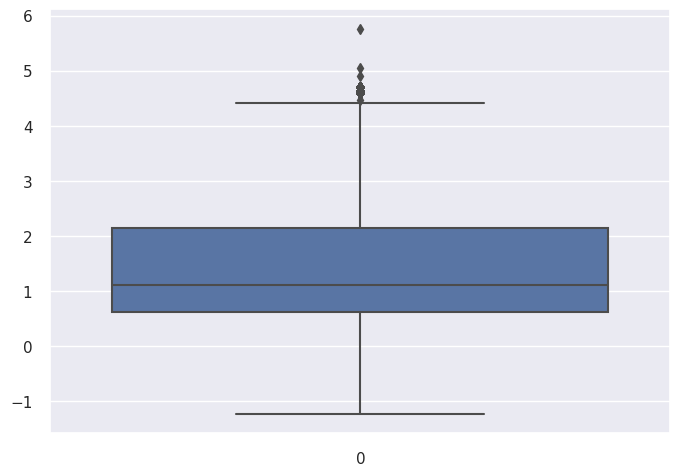

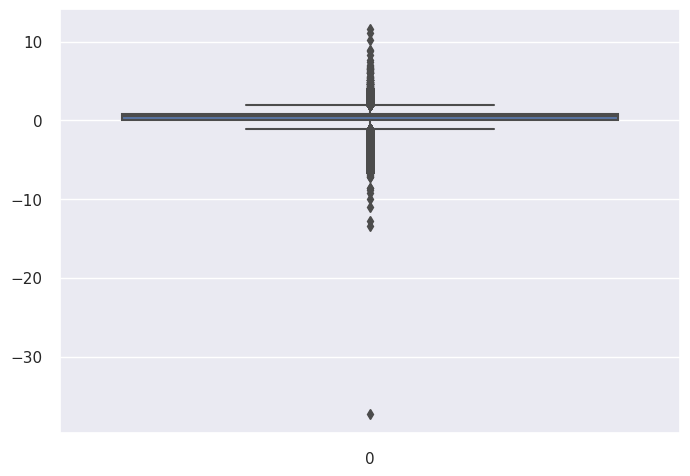

...

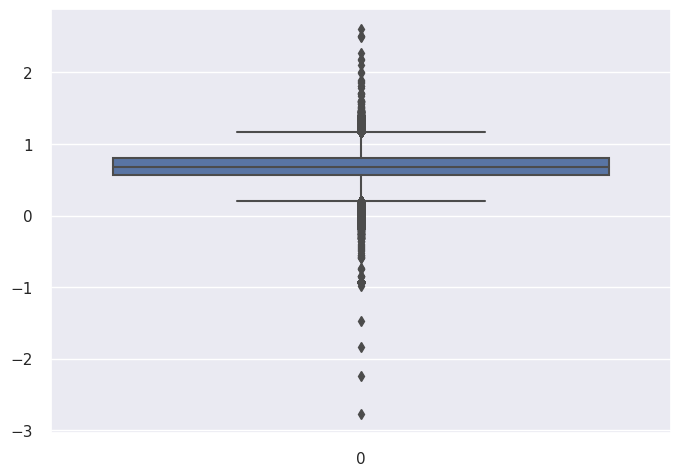

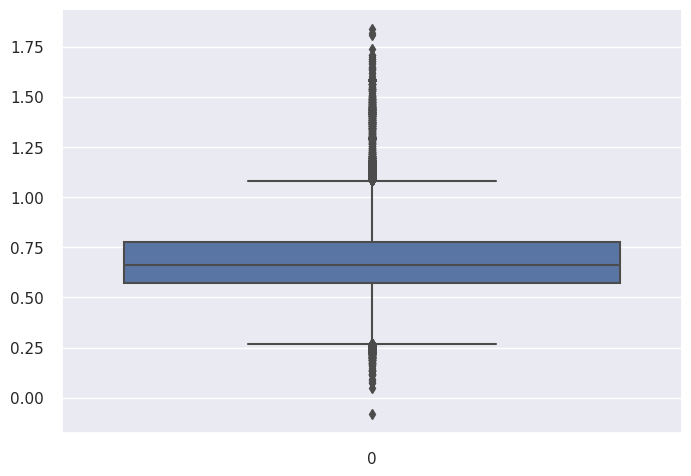

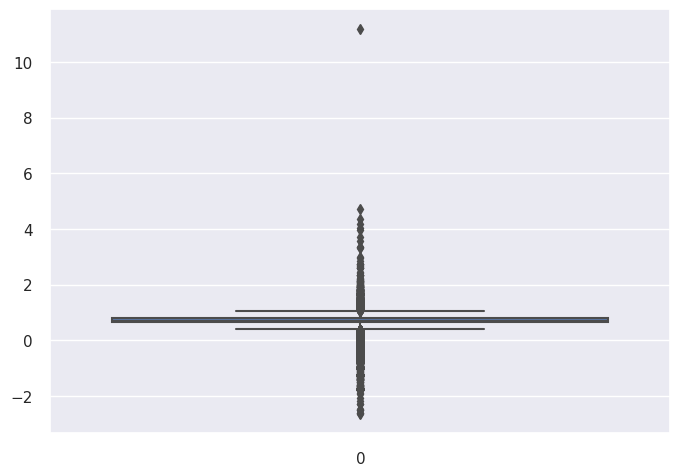

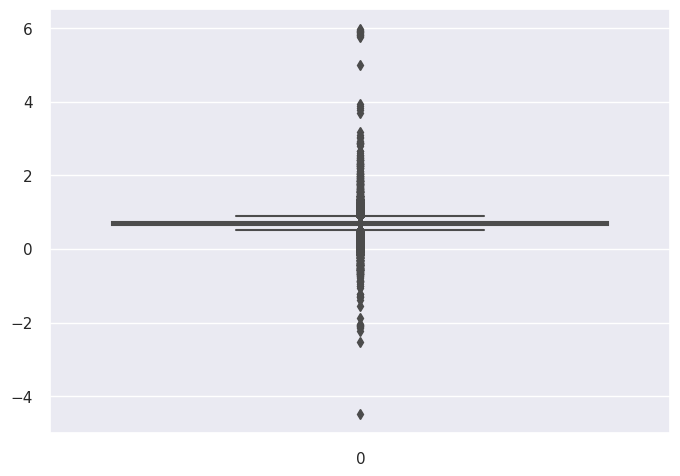

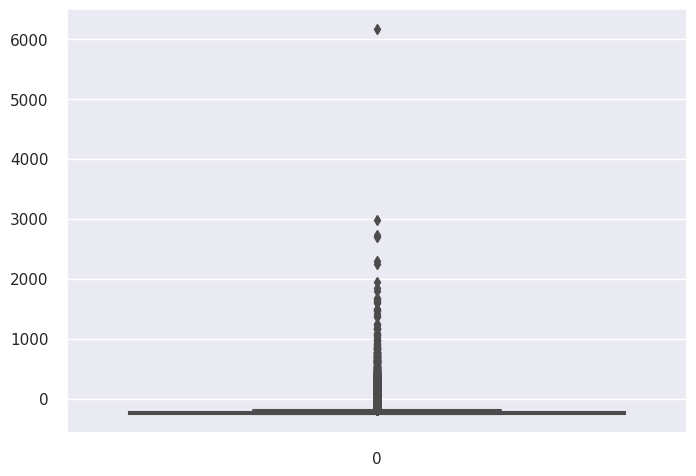

In [55]:
for i in outltrtd_train_features.columns:
  sns.boxplot(outltrtd_train_features[i])
  plt.show()

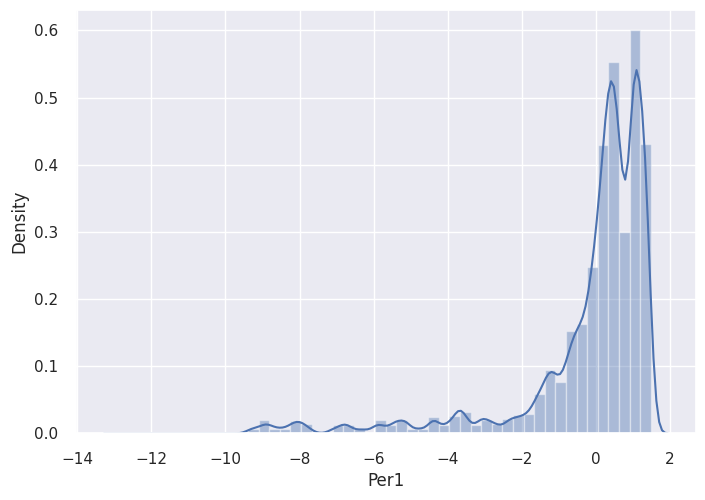

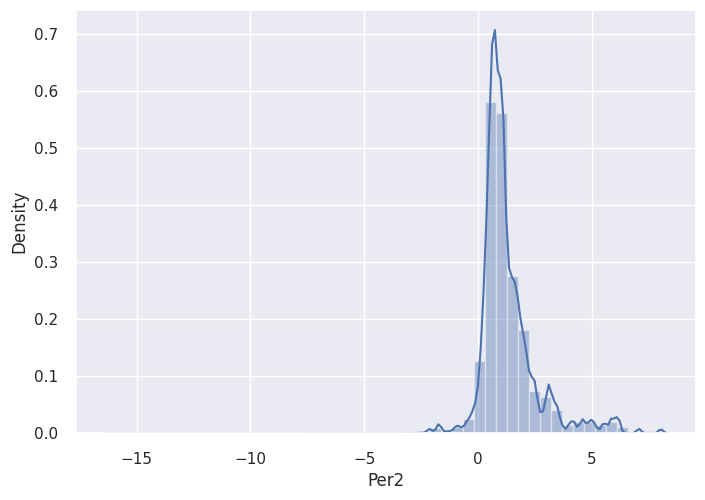

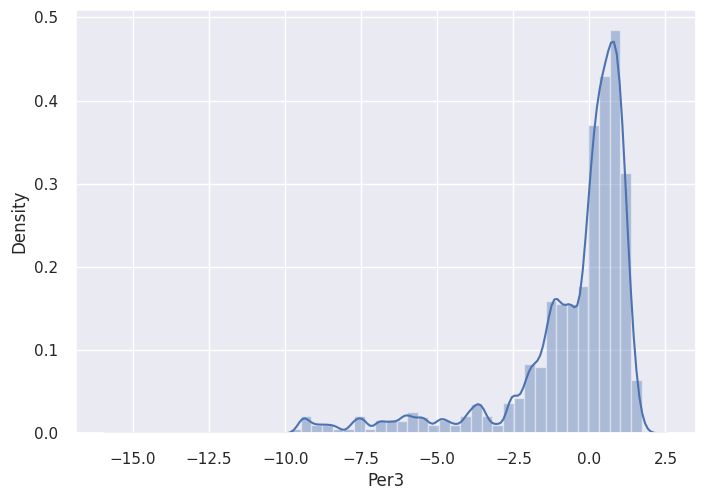

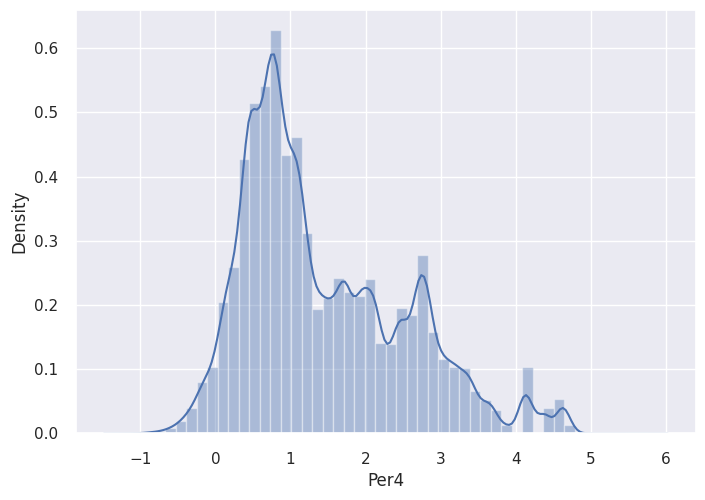

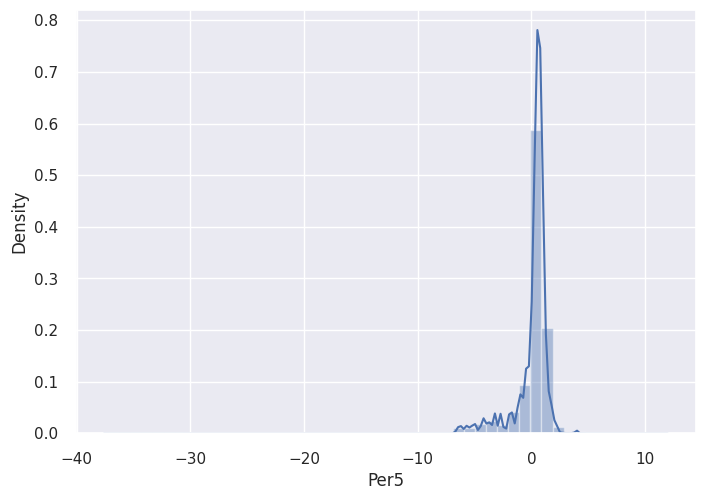

...

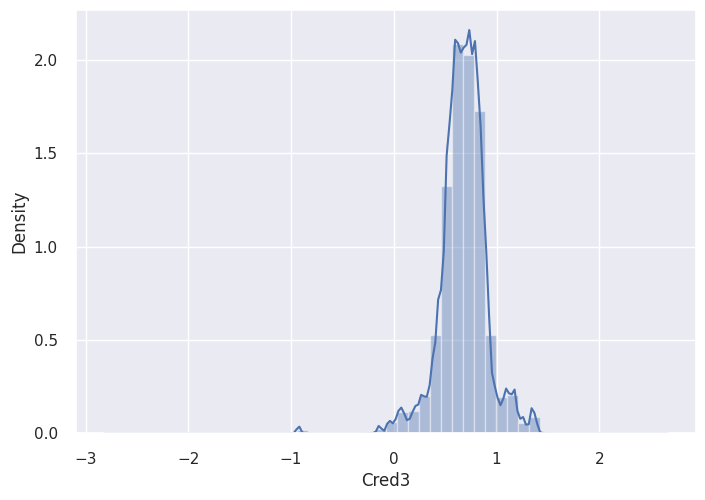

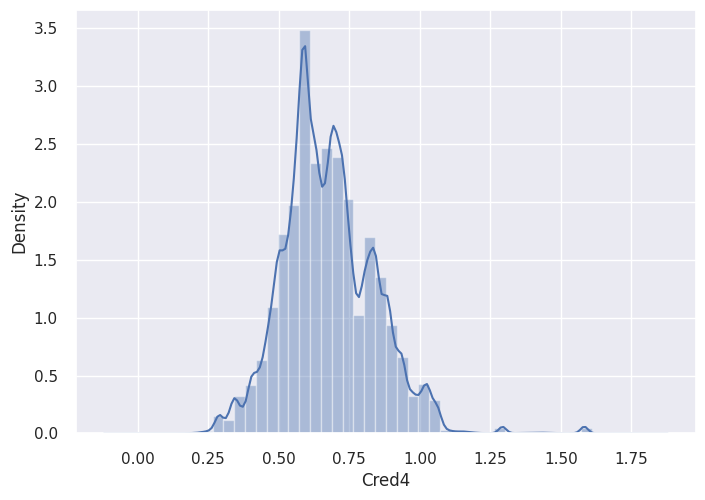

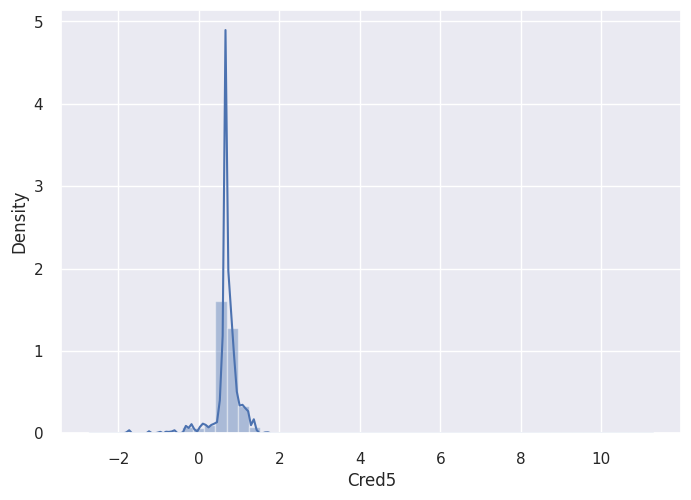

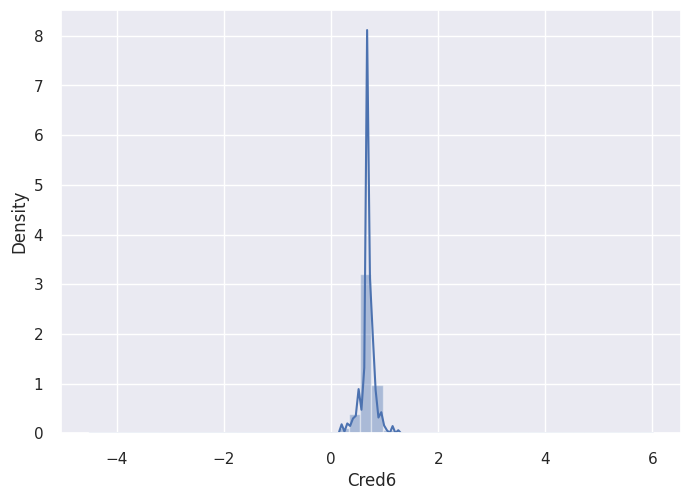

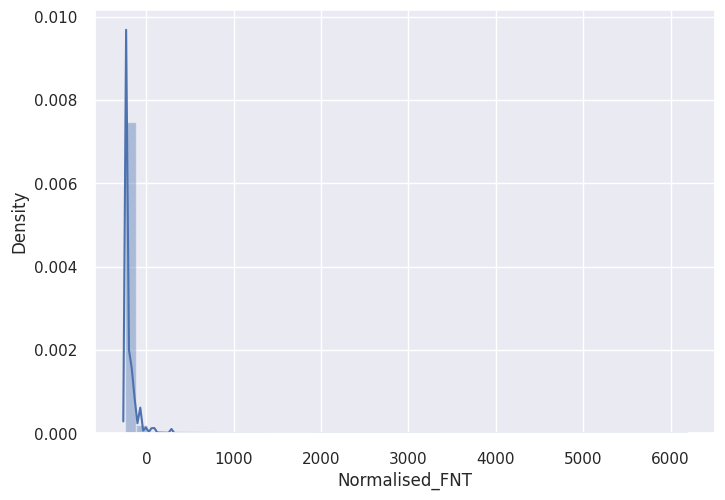

In [56]:
for i in outltrtd_train_features.columns:
  sns.distplot(outltrtd_train_features[i])
  plt.show()

### We see outliers in almost all columns
* This creates skewness of data
* Treating the outliers to overcome skewness

In [57]:
# Using IQR caping method

for i in outltrtd_train_features.columns:
  col_q1 = outltrtd_train_features[i].quantile(0.25)
  col_q3 = outltrtd_train_features[i].quantile(0.75)
  col_iqr = col_q3 - col_q1

  upper_limit = col_q3 + (1.5 * col_iqr)
  lower_limit = col_q1 - (1.5 * col_iqr)

  outltrtd_train_features[i] = np.where(outltrtd_train_features[i] > upper_limit, upper_limit, np.where(outltrtd_train_features[i] < lower_limit, lower_limit, outltrtd_train_features[i]))

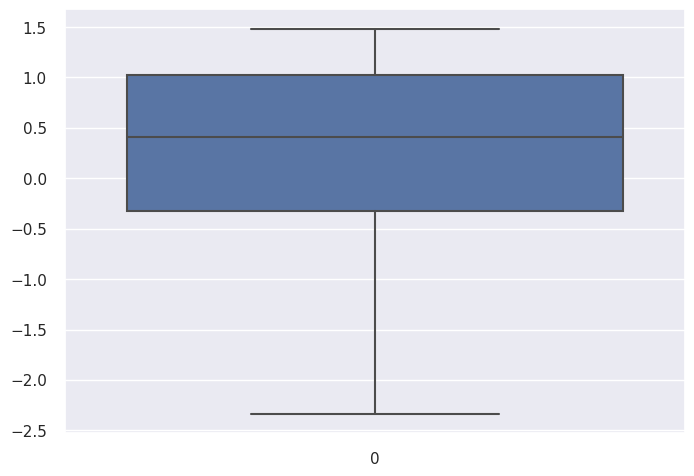

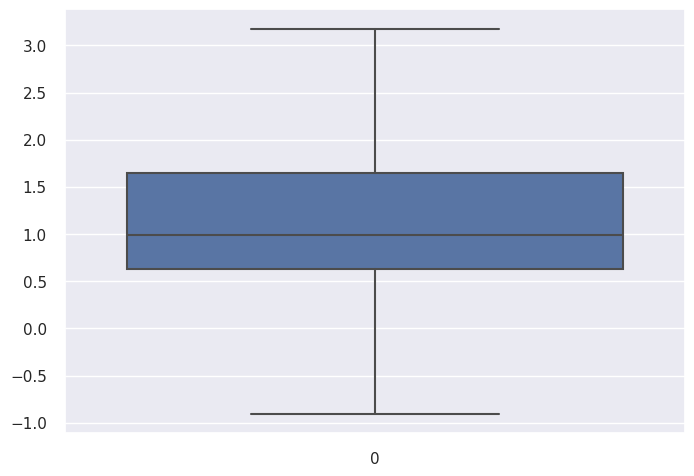

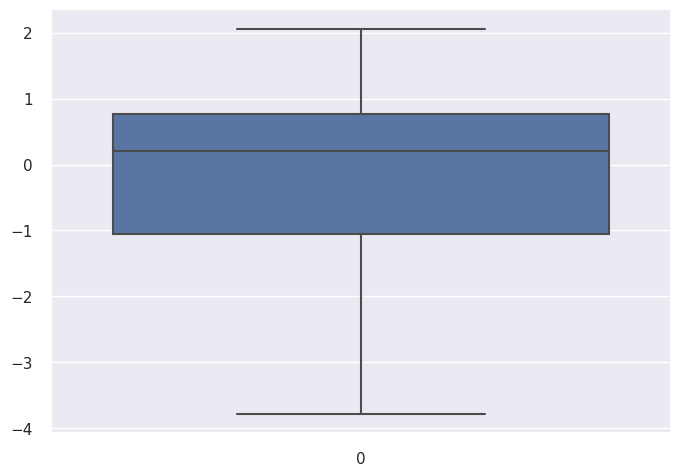

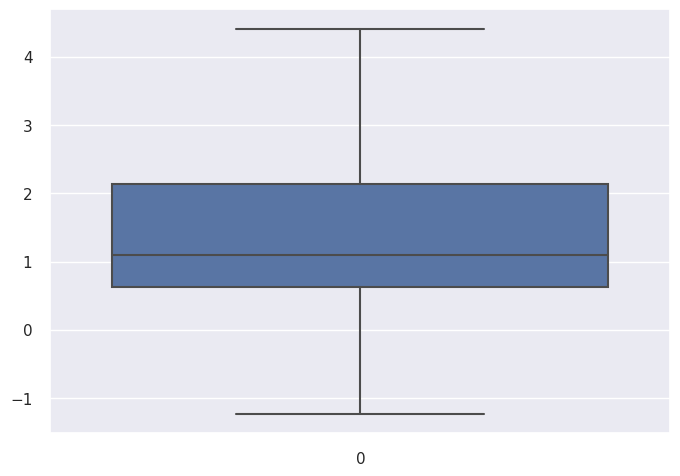

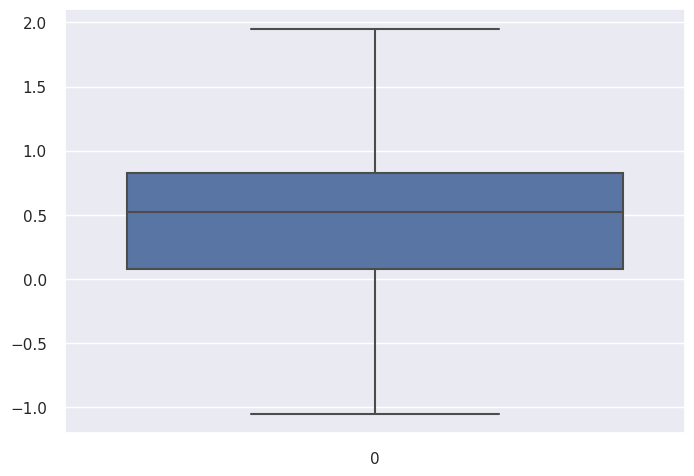

...

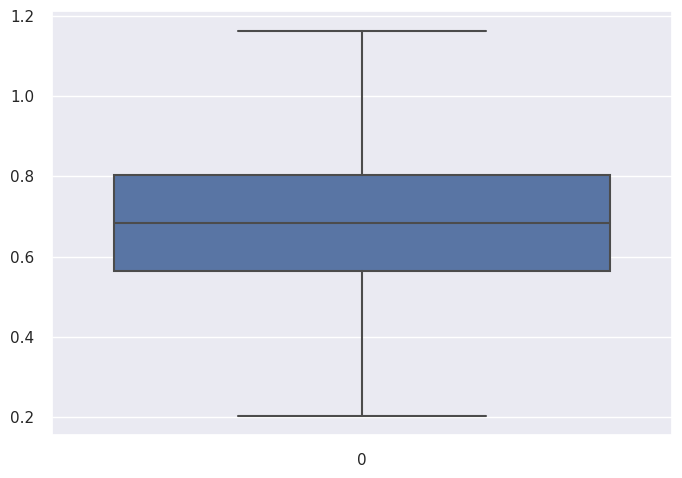

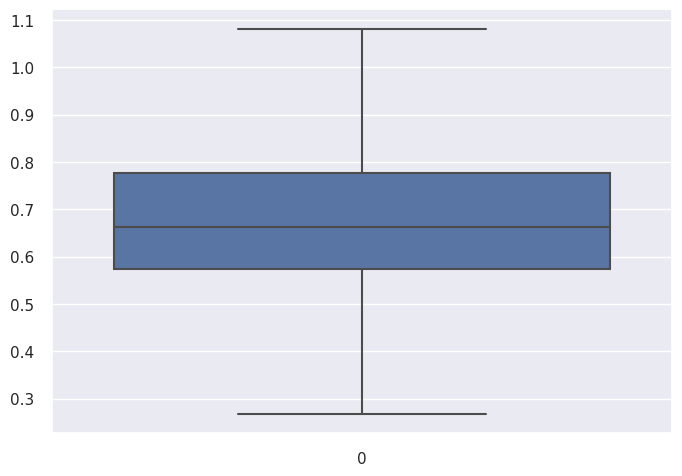

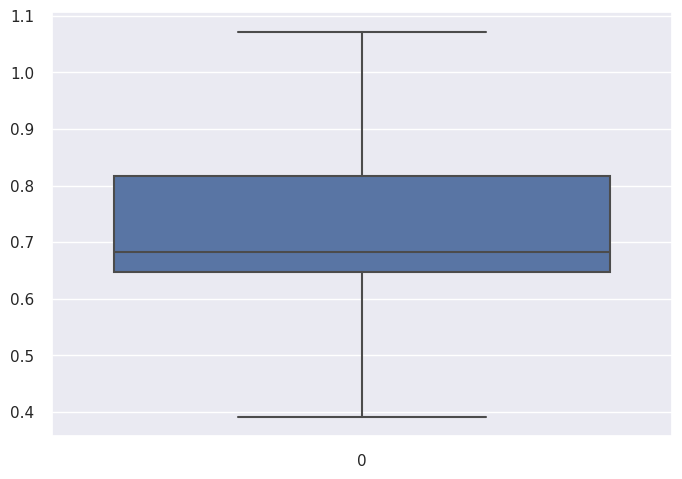

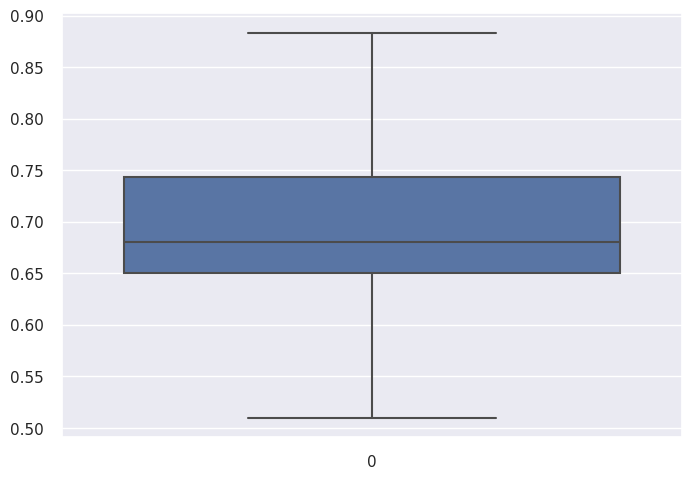

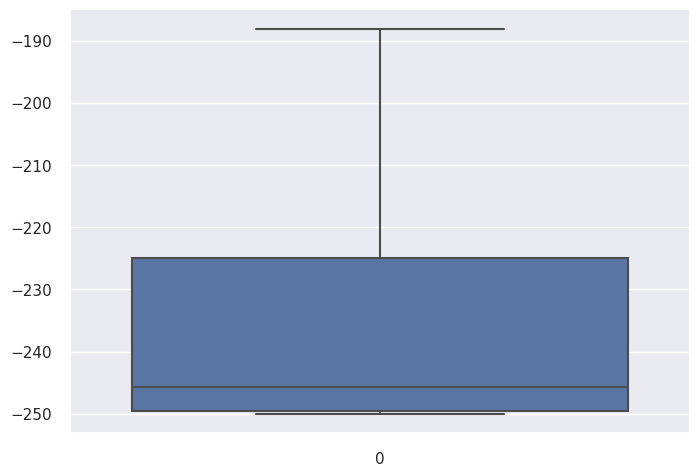

In [58]:
for i in outltrtd_train_features.columns:
  sns.boxplot(outltrtd_train_features[i])
  plt.show()

### We can observe that all outliers are treated and within 1.5 times the IQR

In [59]:
# Iterating with the outlier treated data to see if there is any improvement

outltrtd_clf = setup(data = outltrtd_train_features, target = outltrtd_train_target, use_gpu = True, pca = True, pca_components = 0.95, session_id = 111)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Description,Value
0,Session id,111
1,Target,Target
2,Target type,Binary
3,Original data shape,"(318430, 26)"
4,Transformed data shape,"(318430, 2)"
5,Transformed train set shape,"(222901, 2)"
6,Transformed test set shape,"(95529, 2)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

In [60]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9951,0.9985,0.9974,0.9927,0.9951,0.9901,0.9901,1.8040
rf,Random Forest Classifier,0.9850,0.9982,0.9728,0.9972,0.9848,0.9700,0.9704,4.1960
dt,Decision Tree Classifier,0.9847,0.9852,0.9721,0.9972,0.9845,0.9694,0.9697,0.7340
et,Extra Trees Classifier,0.9843,0.9885,0.9713,0.9973,0.9841,0.9686,0.9690,1.5990
gbc,Gradient Boosting Classifier,0.7997,0.8862,0.7302,0.8481,0.7847,0.5994,0.6053,12.3310
lightgbm,Light Gradient Boosting Machine,0.7899,0.8916,0.7592,0.8090,0.7832,0.5799,0.5811,0.9580
xgboost,Extreme Gradient Boosting,0.7844,0.8831,0.7757,0.7897,0.7825,0.5688,0.5691,0.7330
ada,Ada Boost Classifier,0.7201,0.8025,0.6147,0.7790,0.6871,0.4402,0.4504,3.7370
lr,Logistic Regression,0.5336,0.4363,0.3552,0.5523,0.4324,0.0672,0.0720,0.4310
ridge,Ridge Classifier,0.5336,0.0000,0.3552,0.5522,0.4323,0.0671,0.0719,0.4300


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

### There is slight change in accuracy and speed throughout different models

In [61]:
# Iterating after feature scalling - Trying with outliers and outlier treated dataset

# Feature scalling with outliers

ovrsam_train_features.describe()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
count,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,...,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000
mean,0.127725,1.201351,-0.326793,1.431170,0.366485,0.412216,0.069545,0.793663,0.244454,1.286629,...,0.719761,0.764084,0.671693,0.663280,0.646906,0.681044,0.675578,0.721382,0.689503,-234.534763
std,1.088589,0.895300,1.487737,1.070106,0.727291,0.488425,1.001205,0.368726,0.693844,0.894269,...,0.208507,0.261777,0.275417,0.138367,0.187277,0.199182,0.156459,0.172974,0.092790,20.762115
min,-2.335000,-0.903333,-3.783333,-1.226667,-1.048333,-0.648333,-1.971667,0.063333,-1.451667,-0.893333,...,0.283333,0.195000,-0.081667,0.371667,0.131667,0.203333,0.268333,0.391667,0.510000,-250.000000
25%,-0.320000,0.626667,-1.053333,0.626667,0.076667,0.146667,-0.336667,0.603333,-0.146667,0.600000,...,0.603333,0.610000,0.483333,0.586667,0.526667,0.563333,0.573333,0.646667,0.650000,-249.615000
50%,0.410000,0.990000,0.200000,1.103333,0.523333,0.443333,0.436667,0.723333,0.406667,1.040000,...,0.680000,0.720000,0.666667,0.656667,0.666667,0.683333,0.663333,0.683333,0.680000,-245.752500
75%,1.023333,1.646667,0.766667,2.140000,0.826667,0.676667,0.753333,0.963333,0.723333,1.873333,...,0.816667,0.886667,0.860000,0.730000,0.790000,0.803333,0.776667,0.816667,0.743333,-225.002500
max,1.483333,3.176667,2.063333,4.410000,1.951667,1.471667,2.388333,1.503333,2.028333,3.783333,...,1.136667,1.301667,1.425000,0.945000,1.185000,1.163333,1.081667,1.071667,0.883333,-188.083750


In [62]:
scaler = StandardScaler()
ovrsamscl_train_features = pd.DataFrame(scaler.fit_transform(ovrsam_train_features))
ovrsamscl_train_features.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,-0.016283,-2.350819,0.708096,0.139080,-0.769731,1.264850,0.926007,-0.371539,1.103343,-0.443524,...,1.999488,0.582875,-0.671804,-2.107535,1.298047,-0.055447,-1.164808,-0.624657,0.759745,2.237300
1,0.231745,-0.370101,0.712577,-1.013456,0.811481,1.449115,0.746223,0.433034,0.555668,-0.685808,...,-0.622334,-0.168402,0.623203,0.626737,-0.214864,-1.143230,-0.248699,-0.181429,0.113124,-0.022408
2,0.816601,-0.705185,0.822364,-0.452763,0.004833,0.207027,0.516500,-0.244977,0.843918,-0.335428,...,-0.414507,-0.652275,-0.865449,0.169018,1.013264,0.262520,0.262618,-0.393407,-0.174264,0.037677
3,0.513455,-0.507858,1.024013,-0.636545,0.183579,0.234325,0.636356,-0.543302,1.055301,-0.879635,...,-0.254639,-0.041067,1.325169,0.554466,0.835274,-2.398364,-1.186112,-0.142887,0.113124,-0.380754
4,0.418531,-0.299361,0.999367,-0.636545,0.458572,0.323046,0.739565,-0.281138,0.661360,-1.159193,...,-0.606347,0.035334,1.216243,-0.481426,-0.090271,-0.825263,-1.399161,0.146174,0.472358,-0.732838


In [63]:
ovrsamscld_clf = setup(data = ovrsamscl_train_features, target = ovrsam_train_target, use_gpu = True, pca = True, pca_components = 0.95, session_id = 111)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Description,Value
0,Session id,111
1,Target,Target
2,Target type,Binary
3,Original data shape,"(318430, 26)"
4,Transformed data shape,"(318430, 19)"
5,Transformed train set shape,"(222901, 19)"
6,Transformed test set shape,"(95529, 19)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

In [64]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,1.0000,1.0000,1.0000,0.9999,1.0000,0.9999,0.9999,2.4880
rf,Random Forest Classifier,0.9999,1.0000,1.0000,0.9998,0.9999,0.9998,0.9998,8.3910
xgboost,Extreme Gradient Boosting,0.9999,1.0000,1.0000,0.9997,0.9999,0.9997,0.9997,0.8150
lightgbm,Light Gradient Boosting Machine,0.9998,1.0000,1.0000,0.9996,0.9998,0.9996,0.9996,1.5530
dt,Decision Tree Classifier,0.9996,0.9996,1.0000,0.9992,0.9996,0.9992,0.9992,3.7160
knn,K Neighbors Classifier,0.9994,0.9999,1.0000,0.9988,0.9994,0.9988,0.9988,86.6480
gbc,Gradient Boosting Classifier,0.9936,0.9995,0.9944,0.9928,0.9936,0.9871,0.9871,106.8100
ada,Ada Boost Classifier,0.9663,0.9973,0.9509,0.9811,0.9658,0.9326,0.9331,22.5550
svm,SVM - Linear Kernel,0.9289,0.0000,0.8841,0.9712,0.9256,0.8578,0.8613,0.7000
lr,Logistic Regression,0.9248,0.9759,0.8908,0.9558,0.9222,0.8496,0.8516,0.6300


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=111, verbose=0, warm_start=False)

In [65]:
# Iterating after feature scalling - Trying with outliers and outlier treated dataset

# Feature scalling after outlier treatment

outltrtd_train_features.describe()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
count,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,...,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000,318430.000000
mean,0.127725,1.201351,-0.326793,1.431170,0.366485,0.412216,0.069545,0.793663,0.244454,1.286629,...,0.719761,0.764084,0.671693,0.663280,0.646906,0.681044,0.675578,0.721382,0.689503,-234.534763
std,1.088589,0.895300,1.487737,1.070106,0.727291,0.488425,1.001205,0.368726,0.693844,0.894269,...,0.208507,0.261777,0.275417,0.138367,0.187277,0.199182,0.156459,0.172974,0.092790,20.762115
min,-2.335000,-0.903333,-3.783333,-1.226667,-1.048333,-0.648333,-1.971667,0.063333,-1.451667,-0.893333,...,0.283333,0.195000,-0.081667,0.371667,0.131667,0.203333,0.268333,0.391667,0.510000,-250.000000
25%,-0.320000,0.626667,-1.053333,0.626667,0.076667,0.146667,-0.336667,0.603333,-0.146667,0.600000,...,0.603333,0.610000,0.483333,0.586667,0.526667,0.563333,0.573333,0.646667,0.650000,-249.615000
50%,0.410000,0.990000,0.200000,1.103333,0.523333,0.443333,0.436667,0.723333,0.406667,1.040000,...,0.680000,0.720000,0.666667,0.656667,0.666667,0.683333,0.663333,0.683333,0.680000,-245.752500
75%,1.023333,1.646667,0.766667,2.140000,0.826667,0.676667,0.753333,0.963333,0.723333,1.873333,...,0.816667,0.886667,0.860000,0.730000,0.790000,0.803333,0.776667,0.816667,0.743333,-225.002500
max,1.483333,3.176667,2.063333,4.410000,1.951667,1.471667,2.388333,1.503333,2.028333,3.783333,...,1.136667,1.301667,1.425000,0.945000,1.185000,1.163333,1.081667,1.071667,0.883333,-188.083750


In [66]:
outltrtdscl_train_features = pd.DataFrame(scaler.fit_transform(outltrtd_train_features))
outltrtdscl_train_features.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,-0.016283,-2.350819,0.708096,0.139080,-0.769731,1.264850,0.926007,-0.371539,1.103343,-0.443524,...,1.999488,0.582875,-0.671804,-2.107535,1.298047,-0.055447,-1.164808,-0.624657,0.759745,2.237300
1,0.231745,-0.370101,0.712577,-1.013456,0.811481,1.449115,0.746223,0.433034,0.555668,-0.685808,...,-0.622334,-0.168402,0.623203,0.626737,-0.214864,-1.143230,-0.248699,-0.181429,0.113124,-0.022408
2,0.816601,-0.705185,0.822364,-0.452763,0.004833,0.207027,0.516500,-0.244977,0.843918,-0.335428,...,-0.414507,-0.652275,-0.865449,0.169018,1.013264,0.262520,0.262618,-0.393407,-0.174264,0.037677
3,0.513455,-0.507858,1.024013,-0.636545,0.183579,0.234325,0.636356,-0.543302,1.055301,-0.879635,...,-0.254639,-0.041067,1.325169,0.554466,0.835274,-2.398364,-1.186112,-0.142887,0.113124,-0.380754
4,0.418531,-0.299361,0.999367,-0.636545,0.458572,0.323046,0.739565,-0.281138,0.661360,-1.159193,...,-0.606347,0.035334,1.216243,-0.481426,-0.090271,-0.825263,-1.399161,0.146174,0.472358,-0.732838


In [67]:
outltrtdscl_clf = setup(data = outltrtdscl_train_features, target = ovrsam_train_target, use_gpu = True, pca = True, pca_components = 0.95, session_id = 111)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

,Description,Value
0,Session id,111
1,Target,Target
2,Target type,Binary
3,Original data shape,"(318430, 26)"
4,Transformed data shape,"(318430, 19)"
5,Transformed train set shape,"(222901, 19)"
6,Transformed test set shape,"(95529, 19)"
7,Numeric features,25
8,Preprocess,True
9,Imputation type,simple


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 2, number of used features: 0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Warning] Using sparse features with CUDA is currently not supported.
[LightGBM] [Info] Number of positive: 1, number of negative: 1
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset migh

In [68]:
compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
et,Extra Trees Classifier,1.0000,1.0000,1.0000,0.9999,1.0000,0.9999,0.9999,2.5820
rf,Random Forest Classifier,0.9999,1.0000,1.0000,0.9998,0.9999,0.9998,0.9998,8.3670
xgboost,Extreme Gradient Boosting,0.9999,1.0000,1.0000,0.9997,0.9999,0.9997,0.9997,0.7840
lightgbm,Light Gradient Boosting Machine,0.9998,1.0000,1.0000,0.9996,0.9998,0.9996,0.9996,1.4260
dt,Decision Tree Classifier,0.9996,0.9996,1.0000,0.9992,0.9996,0.9992,0.9992,3.7170
knn,K Neighbors Classifier,0.9994,0.9999,1.0000,0.9988,0.9994,0.9988,0.9988,85.3170
gbc,Gradient Boosting Classifier,0.9936,0.9995,0.9944,0.9928,0.9936,0.9871,0.9871,106.4430
ada,Ada Boost Classifier,0.9663,0.9973,0.9509,0.9811,0.9658,0.9326,0.9331,22.2190
svm,SVM - Linear Kernel,0.9289,0.0000,0.8841,0.9712,0.9256,0.8578,0.8613,0.7230
lr,Logistic Regression,0.9248,0.9759,0.8908,0.9558,0.9222,0.8496,0.8516,0.6590


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     n_estimators=100, n_jobs=-1, oob_score=False,
                     random_state=111, verbose=0, warm_start=False)

### After all the comparisons we can observe the below

* We get better results after feature scalling
* Outlier treatment doesnt seem to affect the accuracy that significantly
* After oversampling and cross validation for 10 folds we get very good accuracies (more than 99%) in the below models (with or without outlier treatment)
  * Gradient Boosting Classifier - 99.36%
  * KNN Classifier - 99.94%
  * Decission Tree Classifier - 99.96%
  * Light GBM - 99.98%
  * XG Boosting - 99.99%
  * Random Forest Classifier - 99.99%
  * Extra Trees Classifier - 100%

### Using the Random Forest model (to avoid overfitting problem of 100% with Extra Trees Classifier)

In [71]:
# Creating the model

rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9997,1.0000,1.0000,0.9995,0.9997,0.9995,0.9995
1,1.0000,1.0000,1.0000,0.9999,1.0000,0.9999,0.9999
2,0.9999,1.0000,1.0000,0.9998,0.9999,0.9998,0.9998
3,0.9999,1.0000,1.0000,0.9998,0.9999,0.9998,0.9998
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,0.9999,1.0000,0.9999,0.9999
6,0.9999,1.0000,1.0000,0.9997,0.9999,0.9997,0.9997
7,0.9999,1.0000,1.0000,0.9997,0.9999,0.9997,0.9997
8,0.9999,1.0000,1.0000,0.9998,0.9999,0.9998,0.9998


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [72]:
# Hyperparameter tuning

@jit(target_backend='cuda')
def tune():
  tuned_rf = tune_model(rf)

tune()

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9886,0.9992,0.9838,0.9933,0.9885,0.9771,0.9772
1,0.9876,0.9993,0.9823,0.9928,0.9876,0.9752,0.9753
2,0.9894,0.9991,0.9814,0.9973,0.9893,0.9787,0.9789
3,0.9886,0.9996,0.9806,0.9964,0.9885,0.9771,0.9772
4,0.9878,0.9997,0.9803,0.9953,0.9878,0.9757,0.9758
5,0.9905,0.9993,0.9838,0.9973,0.9905,0.9811,0.9812
6,0.9921,0.9996,0.9898,0.9945,0.9921,0.9843,0.9843
7,0.9896,0.9990,0.9835,0.9957,0.9896,0.9793,0.9793
8,0.9946,0.9997,0.9925,0.9967,0.9946,0.9891,0.9892


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


### We see that the default model is better than the tuned model.

### Evaluating Random Forest Classifier model

In [73]:
evaluate_model(rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

### Defining the predictive model as Random Forest Classifier

In [74]:
predict_model(rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,1.0000,1.0000,1.0000,0.9999,1.0000,0.9999,0.9999


,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,Target,prediction_label,prediction_score
299561,-2.262312,2.206322,-2.323358,1.219971,-1.945328,-1.526438,-2.038758,-0.308258,-2.091427,1.517113,...,-0.312793,1.511634,-0.122387,-0.610881,-1.906163,-1.826742,-0.197246,1,1,1.0
105889,1.092187,-0.869004,0.398901,-0.891972,1.104807,2.169117,0.057053,0.613838,1.814359,-0.376430,...,0.891733,1.298047,-1.059554,0.923068,-0.354866,-0.425728,-0.552822,0,0,1.0
275957,-0.748118,0.556965,0.401142,0.301058,-0.458072,0.739350,0.280118,-1.980687,1.963288,0.495793,...,0.482194,0.959867,-0.925673,-0.930454,-1.906163,-1.934512,1.418440,1,1,1.0
8735,0.338917,-0.020124,0.179328,0.354012,1.893121,2.169117,0.736235,0.686159,-0.563702,-0.913182,...,-0.216431,1.440438,-1.360787,0.901763,0.049821,0.472358,-0.004226,0,0,1.0
212285,-1.550381,1.461691,-0.943184,1.179477,-0.338908,0.862194,-0.948404,-1.980687,0.152118,0.916994,...,2.036032,0.390301,0.011494,0.944373,0.223258,2.088912,0.530162,1,1,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131550,0.838035,-0.455733,0.885099,0.089241,0.256911,0.602857,0.536476,-0.190736,0.377914,-0.413704,...,0.217199,0.621687,0.480077,-0.483052,-0.316324,-0.210187,-0.735728,0,0,1.0
64004,0.170503,-0.519027,0.640880,-1.371676,2.058117,2.169117,0.696283,0.523436,0.305851,-0.778994,...,-0.457336,1.333645,0.965396,0.496971,-0.431949,-0.102417,-0.736570,0,0,1.0
177044,0.418531,1.007466,-0.875968,1.403754,0.696900,-1.505964,-0.215952,0.098549,-1.010490,2.147051,...,-1.445046,-0.357255,2.421351,1.050897,1.398775,1.801525,-0.732838,1,1,1.0
127310,0.390973,-0.206282,0.952315,-0.692615,0.376074,-0.175154,0.802822,-0.344419,0.507626,-0.849815,...,0.000384,0.639486,-0.406885,0.113484,0.146174,0.113124,-0.734162,0,0,1.0


### We can see very good results

## Validation of the predictive model

### Doing the same preprocessing as training dataset

In [78]:
validation_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT,Target
128229,1.290000,0.646667,0.200000,1.110000,0.686667,0.243333,0.846667,0.546667,0.743333,0.373333,...,0.640000,0.523333,0.720000,0.656667,0.660000,0.393333,0.656667,0.653333,-227.5000,0
12233,1.343333,0.406667,0.153333,0.476667,0.596667,0.496667,0.600000,0.620000,1.260000,0.110000,...,0.740000,0.976667,0.623333,0.866667,0.783333,1.016667,0.636667,0.643333,-238.7500,0
168508,0.713333,0.983333,0.460000,0.406667,1.070000,0.600000,0.953333,0.693333,0.583333,0.833333,...,0.556667,0.390000,0.673333,0.660000,0.540000,0.710000,0.740000,0.690000,-248.5025,0
183452,1.290000,0.663333,0.133333,0.830000,0.806667,0.526667,0.660000,0.613333,1.310000,1.443333,...,0.566667,0.493333,0.723333,0.850000,0.630000,0.603333,0.653333,0.660000,-233.6850,0
69908,0.376667,0.370000,1.123333,-0.360000,0.333333,0.820000,0.186667,0.953333,0.066667,0.573333,...,0.686667,0.730000,0.656667,0.720000,0.546667,0.553333,0.676667,0.673333,-243.0650,0


In [81]:
validation_features_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
128229,1.290000,0.646667,0.200000,1.110000,0.686667,0.243333,0.846667,0.546667,0.743333,0.373333,...,0.610000,0.640000,0.523333,0.720000,0.656667,0.660000,0.393333,0.656667,0.653333,-227.5000
12233,1.343333,0.406667,0.153333,0.476667,0.596667,0.496667,0.600000,0.620000,1.260000,0.110000,...,0.610000,0.740000,0.976667,0.623333,0.866667,0.783333,1.016667,0.636667,0.643333,-238.7500
168508,0.713333,0.983333,0.460000,0.406667,1.070000,0.600000,0.953333,0.693333,0.583333,0.833333,...,0.680000,0.556667,0.390000,0.673333,0.660000,0.540000,0.710000,0.740000,0.690000,-248.5025
183452,1.290000,0.663333,0.133333,0.830000,0.806667,0.526667,0.660000,0.613333,1.310000,1.443333,...,0.653333,0.566667,0.493333,0.723333,0.850000,0.630000,0.603333,0.653333,0.660000,-233.6850
69908,0.376667,0.370000,1.123333,-0.360000,0.333333,0.820000,0.186667,0.953333,0.066667,0.573333,...,0.540000,0.686667,0.730000,0.656667,0.720000,0.546667,0.553333,0.676667,0.673333,-243.0650


In [82]:
validation_target_df.head()

128229    0
12233     0
168508    0
183452    0
69908     0
Name: Target, dtype: int64

In [84]:
outltrtd_val_features = validation_features_df
outltrtd_val_target = validation_target_df

outltrtd_val_features.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
128229,1.290000,0.646667,0.200000,1.110000,0.686667,0.243333,0.846667,0.546667,0.743333,0.373333,...,0.610000,0.640000,0.523333,0.720000,0.656667,0.660000,0.393333,0.656667,0.653333,-227.5000
12233,1.343333,0.406667,0.153333,0.476667,0.596667,0.496667,0.600000,0.620000,1.260000,0.110000,...,0.610000,0.740000,0.976667,0.623333,0.866667,0.783333,1.016667,0.636667,0.643333,-238.7500
168508,0.713333,0.983333,0.460000,0.406667,1.070000,0.600000,0.953333,0.693333,0.583333,0.833333,...,0.680000,0.556667,0.390000,0.673333,0.660000,0.540000,0.710000,0.740000,0.690000,-248.5025
183452,1.290000,0.663333,0.133333,0.830000,0.806667,0.526667,0.660000,0.613333,1.310000,1.443333,...,0.653333,0.566667,0.493333,0.723333,0.850000,0.630000,0.603333,0.653333,0.660000,-233.6850
69908,0.376667,0.370000,1.123333,-0.360000,0.333333,0.820000,0.186667,0.953333,0.066667,0.573333,...,0.540000,0.686667,0.730000,0.656667,0.720000,0.546667,0.553333,0.676667,0.673333,-243.0650


In [86]:
# Using IQR caping method

for i in outltrtd_val_features.columns:
  col_q1 = outltrtd_val_features[i].quantile(0.25)
  col_q3 = outltrtd_val_features[i].quantile(0.75)
  col_iqr = col_q3 - col_q1

  upper_limit = col_q3 + (1.5 * col_iqr)
  lower_limit = col_q1 - (1.5 * col_iqr)

  outltrtd_val_features[i] = np.where(outltrtd_val_features[i] > upper_limit, upper_limit, np.where(outltrtd_val_features[i] < lower_limit, lower_limit, outltrtd_val_features[i]))

In [87]:
# Feature scalling

outltrtdscl_val_features = pd.DataFrame(scaler.fit_transform(outltrtd_val_features))
outltrtdscl_val_features.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,1.127313,-0.095591,-1.051614,1.039342,0.062288,-1.177237,0.609247,-0.874788,0.243791,-0.872574,...,-0.443879,-0.197961,-0.610155,0.616030,-0.058671,-0.048898,-1.741253,-0.25672,-0.412344,0.595989
1,1.227624,-0.736274,-1.154286,-0.415925,-0.187024,-0.419949,-0.240206,-0.423968,1.771055,-1.659701,...,-0.443879,0.731788,1.315226,-0.468274,1.004174,0.696124,2.248441,-0.62200,-0.654308,-0.119177
2,0.042699,0.803145,-0.479584,-0.576770,1.124175,-0.111055,0.976578,0.026852,-0.229168,0.502407,...,0.219408,-0.972752,-1.176444,0.092573,-0.041801,-0.773784,0.285597,1.26528,0.474860,-0.739145
3,1.127313,-0.051099,-1.198289,0.395961,0.394705,-0.330270,-0.033582,-0.464951,1.918854,2.325752,...,-0.033273,-0.879777,-0.737570,0.653420,0.919821,-0.230120,-0.397131,-0.31760,-0.251034,0.202807
4,-0.590516,-0.834157,0.979827,-2.338409,-0.916494,0.546590,-1.663613,1.625215,-1.756432,-0.274756,...,-1.107166,0.235921,0.267592,-0.094376,0.261869,-0.733513,-0.717160,0.10856,0.071586,-0.393482


In [107]:
# Concating with the target to validate the model

validation_df2 = pd.concat([outltrtdscl_val_features, validation_target_df], axis = 1, join = 'inner')
validation_df2.head()

,0,1,2,3,4,5,6,7,8,9,...,16,17,18,19,20,21,22,23,24,Target
0,1.127313,-0.095591,-1.051614,1.039342,0.062288,-1.177237,0.609247,-0.874788,0.243791,-0.872574,...,-0.197961,-0.610155,0.616030,-0.058671,-0.048898,-1.741253,-0.25672,-0.412344,0.595989,0
2,0.042699,0.803145,-0.479584,-0.576770,1.124175,-0.111055,0.976578,0.026852,-0.229168,0.502407,...,-0.972752,-1.176444,0.092573,-0.041801,-0.773784,0.285597,1.26528,0.474860,-0.739145,0
5,-1.029377,0.838739,0.899156,-1.541842,0.163860,-0.788629,0.724038,0.580132,-0.219315,-0.603556,...,-1.468618,-2.252392,0.055183,1.948925,0.474631,1.203013,-0.86552,0.232896,-0.569889,0
7,-0.665749,0.901028,0.811152,-0.798890,-0.196258,-0.390056,0.379665,0.989968,-0.721834,1.548589,...,0.359888,0.295906,0.129963,0.464316,-0.793920,1.629718,0.83912,0.797480,-0.516490,0
9,-0.496474,0.313734,1.287844,-0.032960,-0.371700,-0.360163,0.597768,-0.505935,0.125551,-0.334538,...,-1.809526,-1.431274,-0.730003,0.447445,1.320331,-0.994519,-0.98728,-0.251034,0.213614,0


In [108]:
# Running the predictive model

validation_predictions2 = predict_model(rf, data = outltrtdscl_val_features)
validation_predictions2

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,prediction_label,prediction_score
0,1.127313,-0.095591,-1.051614,1.039342,0.062288,-1.177237,0.609247,-0.874788,0.243791,-0.872574,...,-0.610155,0.616030,-0.058671,-0.048898,-1.741253,-0.25672,-0.412344,0.595989,0,0.58
1,1.227624,-0.736274,-1.154286,-0.415925,-0.187024,-0.419949,-0.240206,-0.423968,1.771055,-1.659701,...,1.315226,-0.468274,1.004174,0.696124,2.248441,-0.62200,-0.654308,-0.119177,0,0.68
2,0.042699,0.803145,-0.479584,-0.576770,1.124175,-0.111055,0.976578,0.026852,-0.229168,0.502407,...,-1.176444,0.092573,-0.041801,-0.773784,0.285597,1.26528,0.474860,-0.739145,0,0.88
3,1.127313,-0.051099,-1.198289,0.395961,0.394705,-0.330270,-0.033582,-0.464951,1.918854,2.325752,...,-0.737570,0.653420,0.919821,-0.230120,-0.397132,-0.31760,-0.251034,0.202807,1,0.70
4,-0.590516,-0.834157,0.979827,-2.338409,-0.916494,0.546590,-1.663613,1.625215,-1.756432,-0.274756,...,0.267592,-0.094376,0.261869,-0.733513,-0.717160,0.10856,0.071586,-0.393482,0,0.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68349,-0.063882,0.429413,-0.259572,-1.403975,0.782525,-0.858379,0.976578,-0.813312,-1.460833,-0.982174,...,0.168491,-0.842172,-1.323963,-0.391205,-0.631819,0.83912,1.442719,-0.595953,0,0.65
68350,-0.402432,0.972215,0.825819,1.138913,-0.325531,-0.121019,0.195999,0.908001,-0.376968,-0.673301,...,0.451636,-0.019596,0.649892,-0.834191,-0.610484,0.41296,0.716825,-0.742165,1,0.88
68351,0.086585,-0.113388,0.473800,-0.461881,0.662485,-0.370127,0.414102,-0.833804,1.051763,0.342989,...,0.579051,1.064708,-0.666011,-2.676610,-2.210629,-0.07408,-0.896273,-0.794769,0,1.00
68352,0.926691,-0.932039,-0.618924,0.487872,-0.325531,0.227732,-0.389434,-0.403476,2.416447,-0.155192,...,0.564893,-0.318715,0.413704,-0.350934,-0.653155,-0.31760,-0.089724,2.167921,0,0.99


## Predicting the results of the test data

### Doing the same preprocessing as train dataset

In [101]:
test_df.head()

,Per1,Per2,Per3,Per4,Per5,Per6,Per7,Per8,Per9,Dem1,...,Dem7,Dem8,Dem9,Cred1,Cred2,Cred3,Cred4,Cred5,Cred6,Normalised_FNT
0,-0.300000,1.540000,0.220000,-0.280000,0.570000,0.260000,0.700000,1.076667,0.930000,0.156667,...,0.786667,0.546667,0.313333,0.703333,0.813333,0.776667,0.796667,0.823333,0.783333,-249.7500
1,0.633333,0.953333,0.810000,0.466667,0.910000,0.253333,1.040000,0.550000,0.543333,0.433333,...,0.636667,0.770000,0.993333,0.536667,0.703333,0.806667,0.630000,0.673333,0.673333,-249.8125
2,1.043333,0.740000,0.860000,1.006667,0.583333,0.616667,0.630000,0.686667,0.593333,1.250000,...,0.626667,0.756667,0.953333,0.623333,0.753333,0.870000,0.596667,0.680000,0.670000,-248.1200
3,1.283333,0.300000,0.576667,0.636667,0.256667,0.543333,0.356667,0.663333,1.156667,1.186667,...,0.480000,0.460000,0.260000,0.800000,0.606667,0.456667,0.320000,0.676667,0.660000,-222.9875
4,1.186667,0.326667,0.476667,0.866667,0.436667,0.680000,0.476667,0.686667,1.476667,1.213333,...,0.706667,0.740000,0.823333,0.670000,0.896667,0.566667,0.546667,0.650000,0.663333,-196.2200


In [102]:
# Using IQR caping method

for i in test_df.columns:
  col_q1 = test_df[i].quantile(0.25)
  col_q3 = test_df[i].quantile(0.75)
  col_iqr = col_q3 - col_q1

  upper_limit = col_q3 + (1.5 * col_iqr)
  lower_limit = col_q1 - (1.5 * col_iqr)

  test_df[i] = np.where(test_df[i] > upper_limit, upper_limit, np.where(test_df[i] < lower_limit, lower_limit, test_df[i]))

In [103]:
# Feature scalling

scld_test_df = pd.DataFrame(scaler.fit_transform(test_df))
scld_test_df.head()

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,-1.867763,2.290726,-0.996890,-2.144089,-0.261954,-1.124047,0.106609,2.180735,0.791042,-1.530794,...,1.228333,-1.069659,-1.509614,0.426730,0.732780,0.669458,0.847626,1.940977,2.139843,-0.823179
1,-0.114021,0.727393,0.290602,-0.436773,0.684380,-1.144092,1.287517,-0.868475,-0.347791,-0.698897,...,-0.197419,1.003741,1.383638,-1.446060,0.174111,0.853483,-0.221646,0.045637,0.072630,-0.827193
2,0.656373,0.158908,0.399711,0.797983,-0.224843,-0.051653,-0.136519,-0.015112,-0.200528,1.756701,...,-0.292469,0.879956,1.213447,-0.472209,0.428052,1.241980,-0.435500,0.167917,-0.008437,-0.718503
3,1.107335,-1.013592,-0.218576,-0.048053,-1.134067,-0.272145,-1.085877,-0.160808,1.458634,1.566267,...,-1.686537,-1.874262,-1.736536,1.512949,-0.316840,-1.293472,-2.210492,0.106777,-0.251639,0.895468
4,0.925697,-0.942531,-0.436795,0.477861,-0.633066,0.138772,-0.669086,-0.015112,2.401116,1.646450,...,0.467932,0.725224,0.660325,0.052172,1.156014,-0.618715,-0.756282,-0.382344,-0.170572,2.152164


In [109]:
# Running the predictive model

test_predictions = predict_model(rf, data = scld_test_df)
test_predictions

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,prediction_label,prediction_score
0,-1.867763,2.290726,-0.996890,-2.144089,-0.261954,-1.124047,0.106609,2.180736,0.791042,-1.530794,...,-1.509614,0.426730,0.732780,0.669458,0.847626,1.940977,2.139843,-0.823179,0,1.00
1,-0.114021,0.727393,0.290602,-0.436773,0.684380,-1.144092,1.287517,-0.868475,-0.347791,-0.698897,...,1.383638,-1.446060,0.174111,0.853483,-0.221646,0.045637,0.072630,-0.827193,1,0.68
2,0.656373,0.158908,0.399711,0.797983,-0.224843,-0.051653,-0.136519,-0.015112,-0.200528,1.756701,...,1.213447,-0.472209,0.428052,1.241979,-0.435500,0.167917,-0.008437,-0.718503,1,0.67
3,1.107335,-1.013592,-0.218576,-0.048053,-1.134066,-0.272145,-1.085877,-0.160808,1.458634,1.566267,...,-1.736536,1.512949,-0.316840,-1.293472,-2.210492,0.106777,-0.251639,0.895468,0,0.97
4,0.925697,-0.942531,-0.436795,0.477861,-0.633066,0.138772,-0.669086,-0.015112,2.401116,1.646450,...,0.660325,0.052172,1.156014,-0.618715,-0.756282,-0.382344,-0.170572,2.152164,0,0.61
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56957,-0.264342,0.967222,0.916163,0.066276,0.025657,-0.883510,0.801261,-0.285690,-0.347791,-0.237846,...,-0.999040,-0.060195,0.546557,-0.352901,0.163292,1.451857,0.721167,-0.807446,1,0.64
56958,1.238865,-0.169747,-0.873233,0.287313,0.072046,0.048571,-0.680663,-0.119181,1.065933,-1.119857,...,0.858882,0.201996,0.106394,-0.168877,1.403648,-0.137783,-0.251639,-0.759121,0,1.00
56959,0.731533,-0.658289,0.283328,-0.383419,-1.171178,-0.953667,-0.472268,-0.514641,-0.711039,-0.558577,...,-2.573310,0.988568,0.563487,-0.393796,1.382263,-0.504624,0.153697,0.377707,0,0.83
56960,-0.239288,1.260347,-0.669562,-0.093785,0.359658,-1.224271,0.835993,0.047329,-0.180893,-0.498440,...,1.525465,-0.434753,-0.113688,-0.618715,-0.307188,0.779317,0.883302,-0.602589,0,0.59


In [111]:
# Extracting the final results to excel

test_predictions.to_excel('TestResults.xlsx')

In [110]:
# Saving model for deployment

save_model(rf, "fraudulent_detection_rf")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(exclude=None,
                                     include=['0', '1', '2', '3', '4', '5', '6',
                                              '7', '8', '9', '10', '11', '12',
                                              '13', '14', '15', '16', '17', '18',
                                              '19', '20', '21', '22', '23',
                                              '24'],
                                     transformer=SimpleImputer(add_indicator=False,
                                                               copy=True,
                                                               fill_value=None,
                                                               keep_empty_features=False,
                                                               missing_values=nan,
                                                               strategy='...
           